In [1]:
import torch, torchvision, os, PIL, pdb
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import random

In [2]:
!pip install -q kaggle

from google.colab import files
files.upload()

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d splcher/animefacedataset

!unzip animefacedataset.zip -d animefacedataset

KeyboardInterrupt: 

In [2]:
print(os.listdir())

['.config', 'animefacedataset.zip', 'animefacedataset', 'data', 'sample_data']


In [3]:
print(os.listdir('animefacedataset'))

['filtered_images', 'images']


In [4]:
data_dir = 'animefacedataset/images'

In [5]:
# Determine the appropriate resolution for preprocessing by analyzing the size of 1000 random images

all_images = os.listdir(data_dir)
len(all_images )

random_images = random.sample(all_images, 1000)

widths = []
heights = []

for img_name in random_images:
    img_path = os.path.join(data_dir, img_name)
    img = Image.open(img_path)
    width, height = img.size
    widths.append(width)
    heights.append(height)

avg_width = np.mean(widths)
avg_height = np.mean(heights)

print(f"Average Width: {avg_width}")
print(f"Average height: {avg_height}")


Average Width: 89.296
Average height: 89.295


In [6]:
# Parameters

n_epochs=150
batch_size=128
lr=1e-4
z_dim=200
device='cuda'

image_size=128

cur_step=0
crit_cycles=5
gen_losses=[]
crit_losses=[]
show_step=500
save_step=50
info_step=100
real_show_step=5000

In [7]:
# Filter and copy images that fall within the specified resolution range (100x100 to 140x140)

output_dir = 'animefacedataset/filtered_images/'

os.makedirs(output_dir, exist_ok=True)

all_images = os.listdir(data_dir)

filtered_count = 0

for img_name in all_images:
    img_path = os.path.join(data_dir, img_name)
    img = Image.open(img_path)
    width, height = img.size
    if 140 >= width >= 100 and 140 >= height >= 100:
        img.save(os.path.join(output_dir, img_name))
        filtered_count += 1

print(f"Total number of filtered and copied images: {filtered_count}")

Total number of filtered and copied images: 18288


In [8]:
# Formula for new width and height after ConvTranspose2d:
# new_width = (old_width - 1) * stride - 2 * padding + kernel_size
# new_height = (old_height - 1) * stride - 2 * padding + kernel_size

In [9]:
# Generator

class Generator(nn.Module):
  def __init__(self, z_dim=z_dim, d_dim=16):
    super(Generator, self).__init__()
    self.z_dim = z_dim

    def genBlock(in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        )

    self.gen = nn.Sequential(
            genBlock(z_dim, d_dim * 32, 4, 1, 0),  # 1x1 -> 4x4 (channels: 64 -> 512)
            genBlock(d_dim * 32, d_dim * 16, 4, 2, 1),  # 4x4 -> 8x8 (channels: 512 -> 256)
            genBlock(d_dim * 16, d_dim * 8, 4, 2, 1),  # 8x8 -> 16x16 (channels: 256 -> 128)
            genBlock(d_dim * 8, d_dim * 4, 4, 2, 1),  # 16x16 -> 32x32 (channels: 128 -> 64)
            genBlock(d_dim * 4, d_dim * 2, 4, 2, 1),  # 32x32 -> 64x64 (channels: 64 -> 32)
            nn.ConvTranspose2d(d_dim * 2, 3, 4, 2, 1),  # 64x64 -> 128x128 (channels: 32 -> 3)
            nn.Tanh()  # Output in range [-1, 1]
    )

  def forward(self, noise):
    x = noise.view(len(noise), self.z_dim, 1, 1)  # Reshape noise into the initial 1x1 image
    return self.gen(x)

def gen_noise(num, z_dim, device='cuda'):
   return torch.randn(num, z_dim, device=device)


In [10]:
# Formula for new width and height after Conv2d:
# new_width = (old_width + 2*padding - kernel_size) // stride + 1
# new_height = (old_height + 2*padding - kernel_size) // stride + 1


In [11]:
# Critic

class Critic(nn.Module):
  def __init__(self, d_dim=16):
    super(Critic, self).__init__()

    def critBlock(in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    self.crit = nn.Sequential(
        critBlock(3, d_dim, 4, 2, 1),  # 128x128 -> 64x64 (channels: 3 -> 16)
        critBlock(d_dim, d_dim*2, 4, 2, 1),  # 64x64 -> 32x32 (channels: 16 -> 32)
        critBlock(d_dim*2, d_dim*4, 4, 2, 1),  # 32x32 -> 16x16 (channels: 32 -> 64)
        critBlock(d_dim*4, d_dim*8, 4, 2, 1),  # 16x16 -> 8x8 (channels: 64 -> 128)
        critBlock(d_dim*8, d_dim*16, 4, 2, 1),  # 8x8 -> 4x4 (channels: 128 -> 256)
        nn.Conv2d(d_dim*16, 1, 4, 1, 0)  # 4x4 -> 1x1 (channels: 256 -> 1)
    )

  def forward(self, image):
    crit_pred = self.crit(image)
    return crit_pred.view(len(crit_pred), -1)

In [12]:
# Custom Dataset class to load, resize, and transform images for model training

class Dataset(Dataset):
    def __init__(self, path, size=128, lim=10000):
        self.sizes = (size, size)
        self.items = [os.path.join(path, data) for data in os.listdir(path)[:lim]]
        self.labels = [data for data in os.listdir(path)[:lim]]

        self.transform = transforms.Compose([
            transforms.Resize(self.sizes),
            transforms.ToTensor(),  # Automatically handles the 0-255 to 0-1 scaling
        ])

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx):
        image = PIL.Image.open(self.items[idx]).convert('RGB')
        image = self.transform(image)
        return image, self.labels[idx]

ds = Dataset(output_dir)
dataloader = DataLoader(ds, batch_size=batch_size, shuffle=True)

In [13]:
# gradient penalty

def get_gp(real, fake, crit, alpha, gamma=10):
  mix_images = real * alpha + fake * (1-alpha)
  mix_scores = crit(mix_images)

  gradient = torch.autograd.grad(
      inputs = mix_images,
      outputs = mix_scores,
      grad_outputs=torch.ones_like(mix_scores),
      retain_graph=True,
      create_graph=True,
  )[0]

  gradient = gradient.view(len(gradient), -1)
  gradient_norm = gradient.norm(2, dim=1)
  gp = gamma * ((gradient_norm-1)**2).mean()

  return gp



In [14]:
root_path='./data/save_and_load/'
os.makedirs(root_path, exist_ok=True)

In [15]:
def save_checkpoint(name):
    try:
        torch.save({
            'epoch': epoch,
            'model_state_dict': gen.state_dict(),
            'optimizer_state_dict': gen_opt.state_dict(),
        }, f"{root_path}G-{name}.pkl")

        torch.save({
            'epoch': epoch,
            'model_state_dict': crit.state_dict(),
            'optimizer_state_dict': crit_opt.state_dict(),
        }, f"{root_path}C-{name}.pkl")

        print("Checkpoint saved successfully.")
    except Exception as e:
        print(f"Error saving checkpoint: {e}")

def load_checkpoint(name):
    try:
        gen_checkpoint = torch.load(f"{root_path}G-{name}.pkl")
        gen.load_state_dict(gen_checkpoint['model_state_dict'])
        gen_opt.load_state_dict(gen_checkpoint['optimizer_state_dict'])

        crit_checkpoint = torch.load(f"{root_path}C-{name}.pkl")
        crit.load_state_dict(crit_checkpoint['model_state_dict'])
        crit_opt.load_state_dict(crit_checkpoint['optimizer_state_dict'])

        print("Checkpoint loaded successfully.")
    except FileNotFoundError:
        print(f"Checkpoint file not found: {name}.pkl")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")


In [16]:
def show(tensor, num=25,  name=''):
  data = tensor.detach().cpu()
  grid = make_grid(data[:num], nrow=5).permute(1,2,0)

  plt.imshow(grid.clip(0,1))
  plt.show()

In [17]:
# Initialize the Generator and Critic models and move them to the GPU
gen = Generator(z_dim).to(device)
crit = Critic().to(device)

# Set up Adam optimizers for both the Generator and Critic with specified learning rates and beta values
gen_opt = torch.optim.Adam(gen.parameters(), lr=2e-4, betas=(0.5, 0.999))
crit_opt = torch.optim.Adam(crit.parameters(), lr = 4e-4, betas = (0.5, 0.999))

# StepLR scheduler to adjust the learning rate of the optimizers after a fixed number of steps
gen_scheduler = torch.optim.lr_scheduler.StepLR(gen_opt, step_size=2500, gamma=0.06)
crit_scheduler = torch.optim.lr_scheduler.StepLR(crit_opt, step_size=2000, gamma=0.04)

  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 0, Step 0: Generator Loss: 0.7325304746627808, Critic Loss: -1.804985761642456


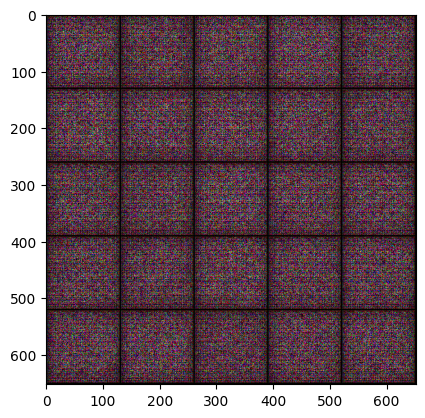

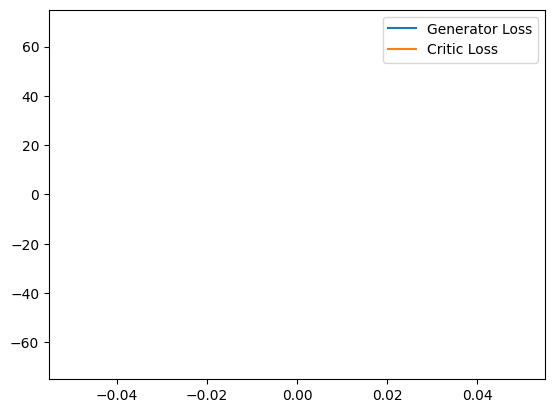

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 1, Step 100: Generator Loss: 29.65985870361328, Critic Loss: -29.856582641601562
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 2, Step 200: Generator Loss: 26.95083236694336, Critic Loss: -29.492294311523438
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 3, Step 300: Generator Loss: 21.424652099609375, Critic Loss: -25.050594329833984
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 5, Step 400: Generator Loss: 23.75937843322754, Critic Loss: -23.14368438720703
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 6, Step 500: Generator Loss: 17.584854125976562, Critic Loss: -22.80571937561035


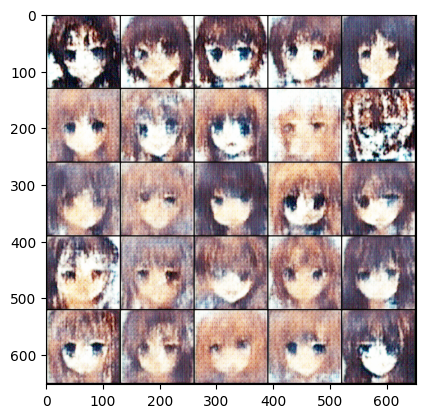

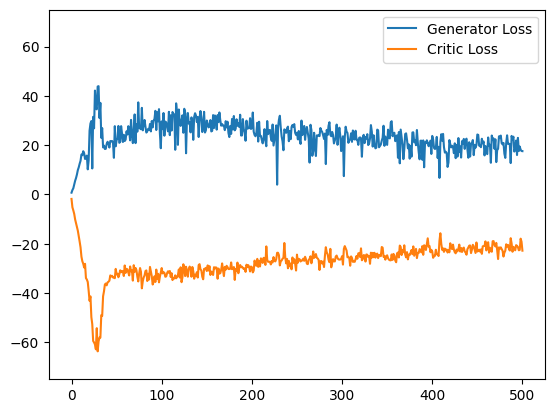

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 7, Step 600: Generator Loss: 18.536819458007812, Critic Loss: -20.33070945739746
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 8, Step 700: Generator Loss: 13.634073257446289, Critic Loss: -19.41320037841797
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 10, Step 800: Generator Loss: 15.908771514892578, Critic Loss: -16.712646484375
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 11, Step 900: Generator Loss: 15.864990234375, Critic Loss: -16.819435119628906
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 12, Step 1000: Generator Loss: 16.042142868041992, Critic Loss: -16.48546028137207


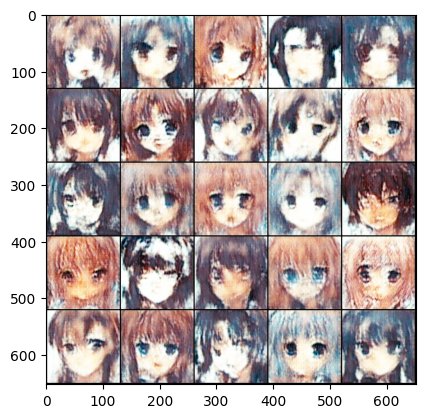

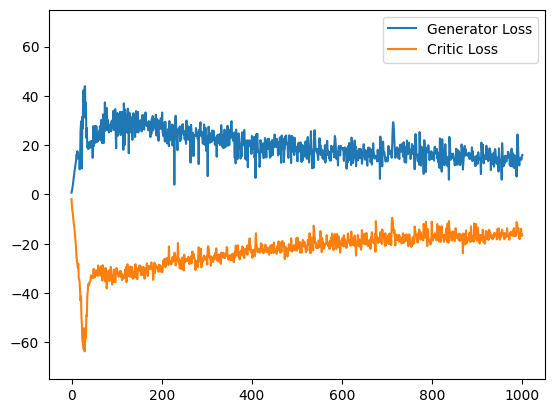

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 13, Step 1100: Generator Loss: 11.258590698242188, Critic Loss: -17.564430236816406
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 15, Step 1200: Generator Loss: 11.062250137329102, Critic Loss: -15.449551582336426
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 16, Step 1300: Generator Loss: 16.184396743774414, Critic Loss: -13.851248741149902
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 17, Step 1400: Generator Loss: 10.916942596435547, Critic Loss: -10.627138137817383
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 18, Step 1500: Generator Loss: 7.083681106567383, Critic Loss: -16.146621704101562


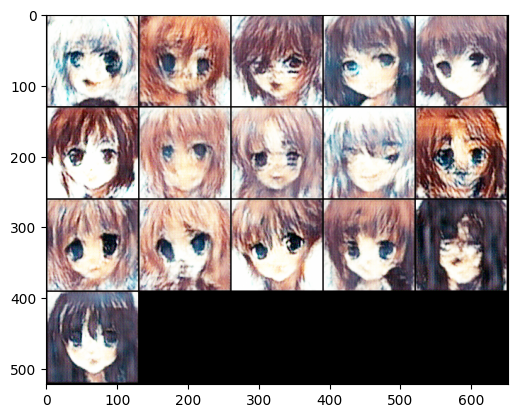

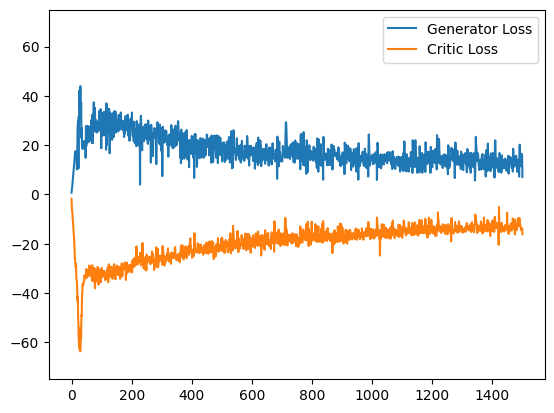

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 20, Step 1600: Generator Loss: 8.142744064331055, Critic Loss: -8.278644561767578
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 21, Step 1700: Generator Loss: 11.143783569335938, Critic Loss: -10.805134773254395
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 22, Step 1800: Generator Loss: 14.402372360229492, Critic Loss: -9.864690780639648
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 24, Step 1900: Generator Loss: 15.421794891357422, Critic Loss: -11.624110221862793
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 25, Step 2000: Generator Loss: 12.015867233276367, Critic Loss: -11.716930389404297


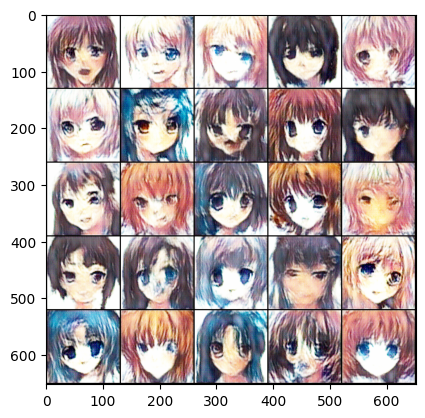

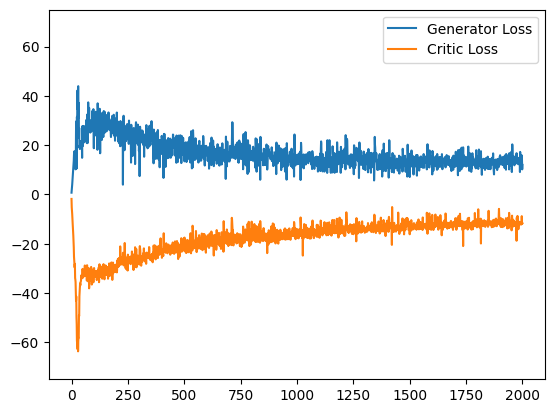

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 26, Step 2100: Generator Loss: 11.857168197631836, Critic Loss: -11.196596145629883
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 27, Step 2200: Generator Loss: 13.704164505004883, Critic Loss: -11.338489532470703
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 29, Step 2300: Generator Loss: 12.893424987792969, Critic Loss: -11.507801055908203
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 30, Step 2400: Generator Loss: 12.289228439331055, Critic Loss: -10.56167984008789
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 31, Step 2500: Generator Loss: 13.875767707824707, Critic Loss: -11.19046688079834


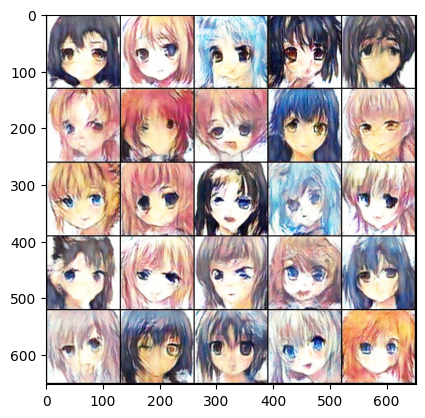

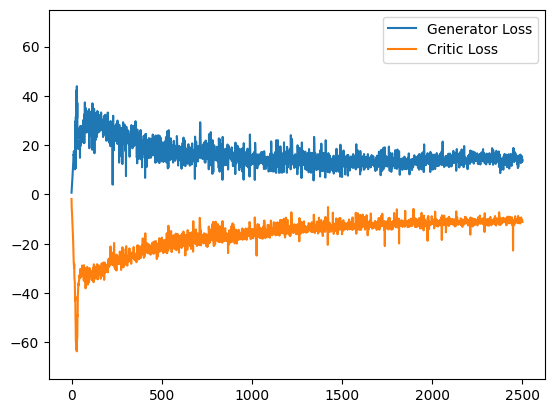

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 32, Step 2600: Generator Loss: 15.25887680053711, Critic Loss: -11.433349609375
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 34, Step 2700: Generator Loss: 13.297433853149414, Critic Loss: -8.36865520477295
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 35, Step 2800: Generator Loss: 11.291552543640137, Critic Loss: -10.05021858215332
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 36, Step 2900: Generator Loss: 12.728376388549805, Critic Loss: -9.359094619750977
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 37, Step 3000: Generator Loss: 12.342967987060547, Critic Loss: -9.529191970825195


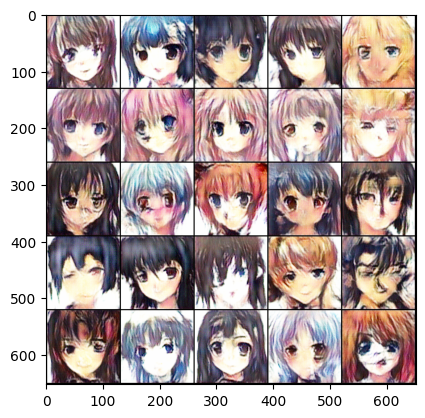

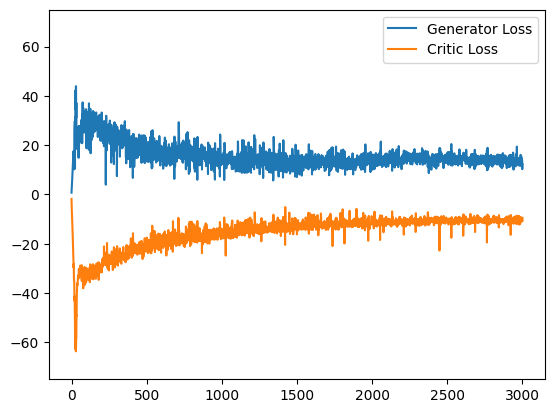

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 39, Step 3100: Generator Loss: 12.585843086242676, Critic Loss: -10.884939193725586
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 40, Step 3200: Generator Loss: 18.40367889404297, Critic Loss: -10.151823043823242
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 41, Step 3300: Generator Loss: 13.581573486328125, Critic Loss: -11.23476791381836
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 43, Step 3400: Generator Loss: 15.258678436279297, Critic Loss: -9.625884056091309
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 44, Step 3500: Generator Loss: 13.752201080322266, Critic Loss: -8.803502082824707


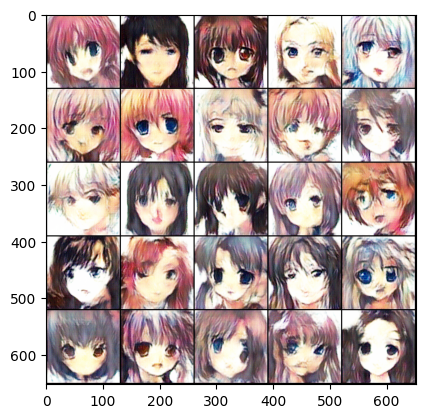

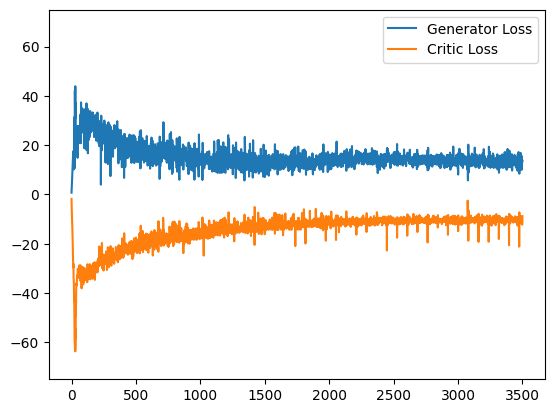

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 45, Step 3600: Generator Loss: 11.081666946411133, Critic Loss: -10.565837860107422
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 46, Step 3700: Generator Loss: 13.21298599243164, Critic Loss: -8.883232116699219
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 48, Step 3800: Generator Loss: 13.027586936950684, Critic Loss: -10.19921875
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 49, Step 3900: Generator Loss: 12.75831413269043, Critic Loss: -10.270452499389648
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
------------ Critic LR has changed: 0.0004 -> 1.6000000000000003e-05 (Epoch 50 - Step 3999) ------------
Epoch 50, Step 4000: Generator Loss: 12.202754974365234, Critic Loss: -8.181282043457031


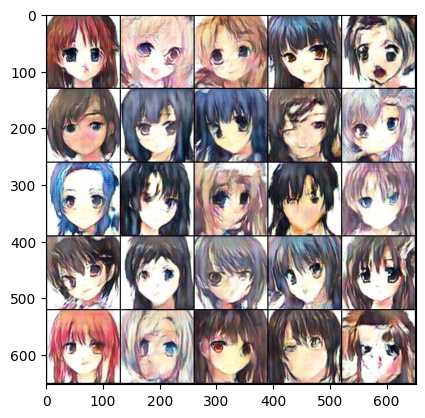

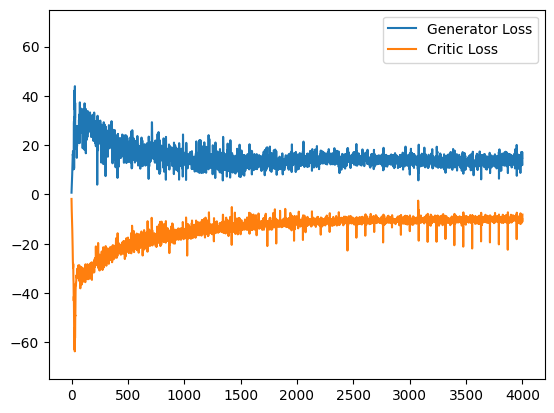

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 51, Step 4100: Generator Loss: 13.043817520141602, Critic Loss: -7.479381084442139
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 53, Step 4200: Generator Loss: 12.196660041809082, Critic Loss: -6.698086738586426
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 54, Step 4300: Generator Loss: 12.405179977416992, Critic Loss: -6.083812236785889
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 55, Step 4400: Generator Loss: 12.6365966796875, Critic Loss: -5.935816764831543
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
------------ Generator LR has changed: 0.0002 -> 1.2e-05 (Epoch 56 - Step 4499) ------------
Epoch 56, Step 4500: Generator Loss: 12.18944263458252, Critic Loss: -6.250101566314697


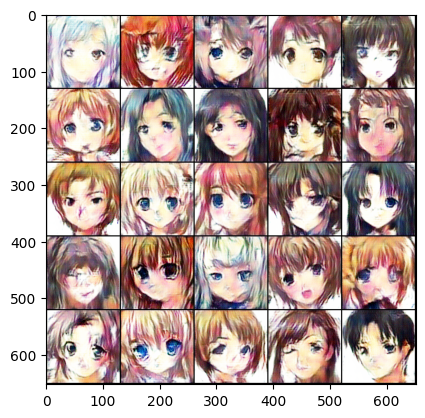

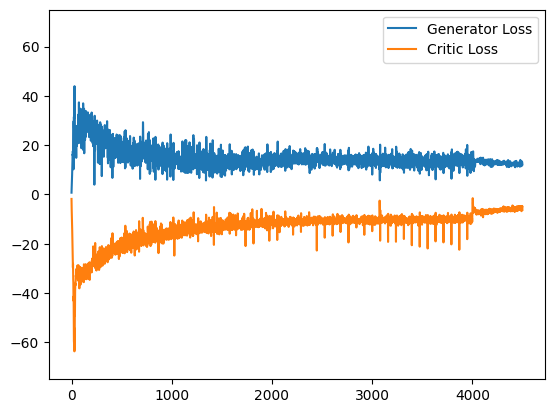

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 58, Step 4600: Generator Loss: 12.51158618927002, Critic Loss: -5.998101711273193
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 59, Step 4700: Generator Loss: 12.710946083068848, Critic Loss: -5.301033973693848
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 60, Step 4800: Generator Loss: 12.609012603759766, Critic Loss: -6.177077293395996
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 62, Step 4900: Generator Loss: 12.924281120300293, Critic Loss: -6.226461887359619
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 63, Step 5000: Generator Loss: 12.779346466064453, Critic Loss: -6.709794998168945


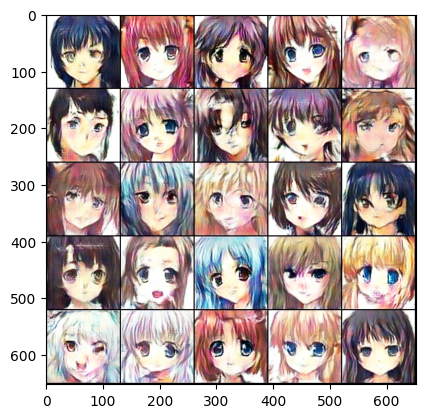

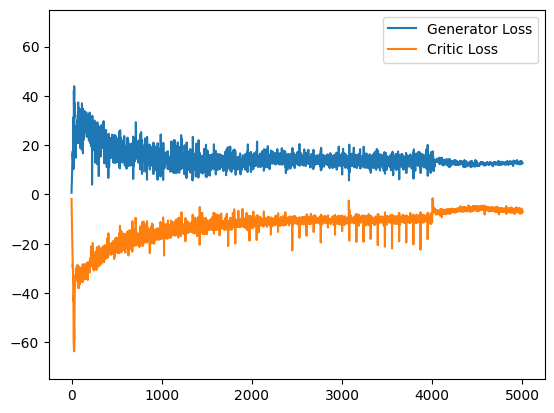

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 64, Step 5100: Generator Loss: 12.890800476074219, Critic Loss: -6.384487628936768
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 65, Step 5200: Generator Loss: 13.494012832641602, Critic Loss: -6.793588638305664
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 67, Step 5300: Generator Loss: 13.043770790100098, Critic Loss: -5.72324275970459
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 68, Step 5400: Generator Loss: 13.597718238830566, Critic Loss: -6.46190071105957
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 69, Step 5500: Generator Loss: 13.199732780456543, Critic Loss: -7.312072277069092


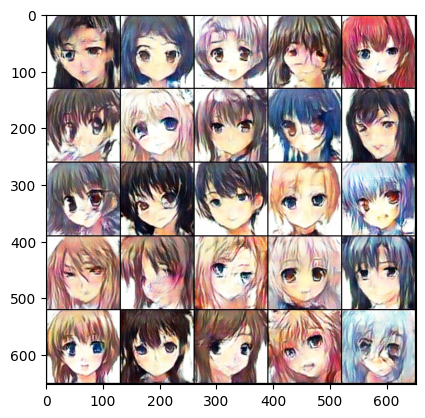

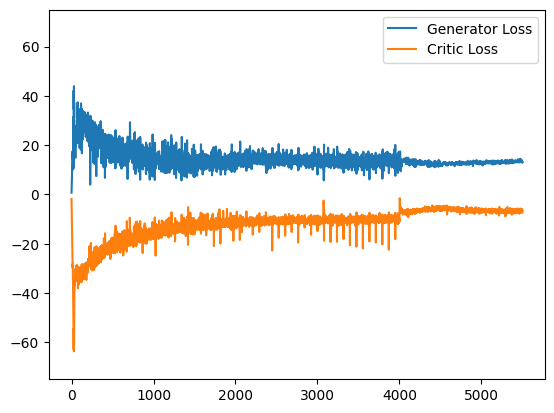

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 70, Step 5600: Generator Loss: 13.472219467163086, Critic Loss: -7.156591415405273
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 72, Step 5700: Generator Loss: 13.403447151184082, Critic Loss: -6.8440704345703125
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 73, Step 5800: Generator Loss: 13.28050708770752, Critic Loss: -7.543838024139404
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 74, Step 5900: Generator Loss: 13.660379409790039, Critic Loss: -6.712886810302734
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
------------ Critic LR has changed: 1.6000000000000003e-05 -> 6.400000000000001e-07 (Epoch 75 - Step 5999) ------------
Epoch 75, Step 6000: Generator Loss: 13.8016357421875, Critic Loss: -6.569785118103027


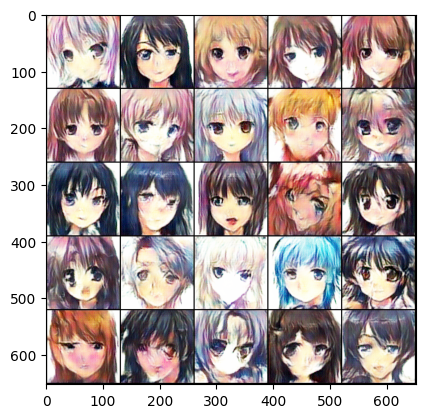

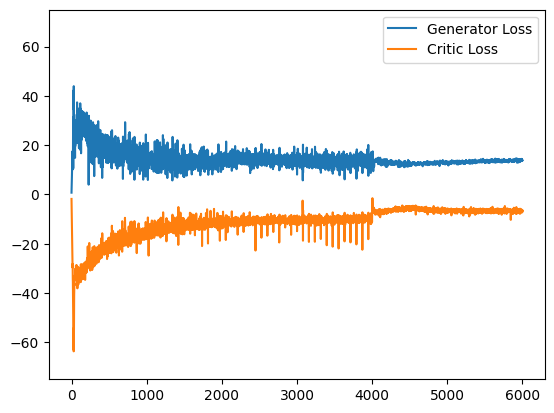

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 77, Step 6100: Generator Loss: 13.853902816772461, Critic Loss: -6.705386161804199
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 78, Step 6200: Generator Loss: 13.619211196899414, Critic Loss: -5.157554626464844
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 79, Step 6300: Generator Loss: 13.620281219482422, Critic Loss: -6.500922679901123
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 81, Step 6400: Generator Loss: 13.341322898864746, Critic Loss: -6.015267848968506
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 82, Step 6500: Generator Loss: 13.037860870361328, Critic Loss: -6.2991790771484375


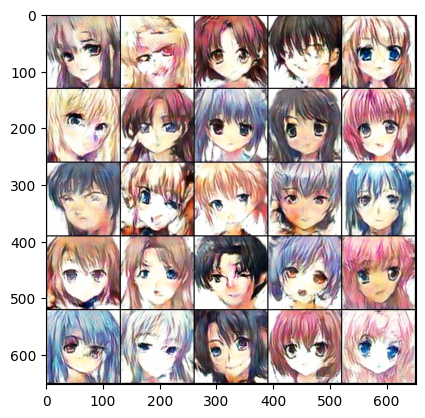

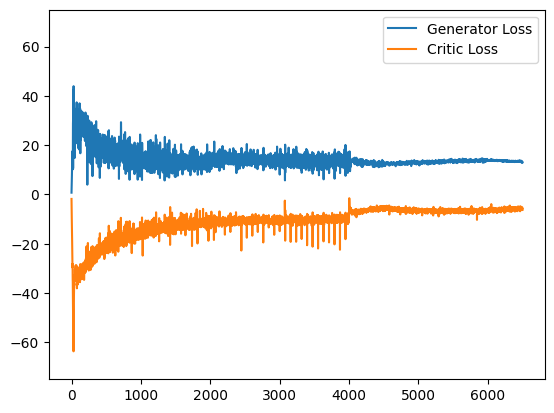

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 83, Step 6600: Generator Loss: 13.21133041381836, Critic Loss: -5.233384609222412
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 84, Step 6700: Generator Loss: 13.073262214660645, Critic Loss: -6.283066749572754
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 86, Step 6800: Generator Loss: 12.958232879638672, Critic Loss: -5.389033317565918
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 87, Step 6900: Generator Loss: 13.270484924316406, Critic Loss: -5.626325607299805
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

------------ Generator LR has changed: 1.2e-05 -> 7.2e-07 (Epoch 88 - Step 6999) ------------
Epoch 88, Step 7000: Generator Loss: 13.128464698791504, Critic Loss: -4.162171363830566


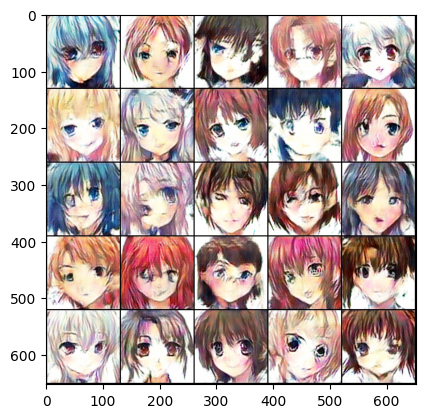

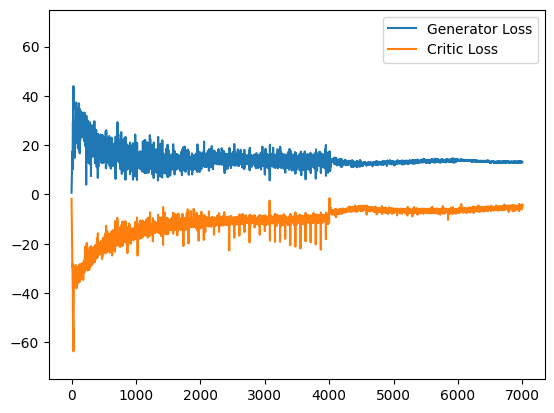

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 89, Step 7100: Generator Loss: 13.162260055541992, Critic Loss: -4.155713081359863
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 91, Step 7200: Generator Loss: 13.414982795715332, Critic Loss: -5.789286136627197
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 92, Step 7300: Generator Loss: 13.375724792480469, Critic Loss: -5.492733955383301
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 93, Step 7400: Generator Loss: 13.315458297729492, Critic Loss: -4.865103721618652
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 94, Step 7500: Generator Loss: 13.349281311035156, Critic Loss: -5.0052337646484375


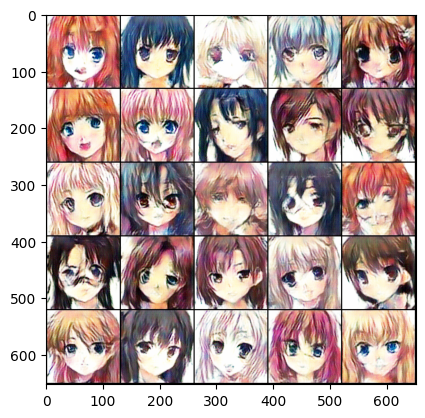

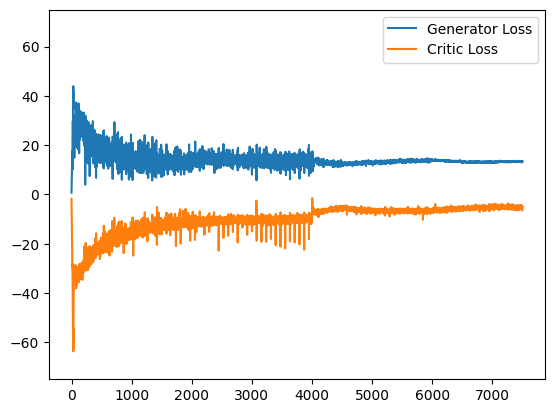

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 96, Step 7600: Generator Loss: 13.578218460083008, Critic Loss: -5.070620059967041
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 97, Step 7700: Generator Loss: 13.27977180480957, Critic Loss: -4.8159403800964355
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 98, Step 7800: Generator Loss: 13.36224365234375, Critic Loss: -5.0540337562561035
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 100, Step 7900: Generator Loss: 13.525849342346191, Critic Loss: -5.662033557891846
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

------------ Critic LR has changed: 6.400000000000001e-07 -> 2.5600000000000004e-08 (Epoch 101 - Step 7999) ------------
Epoch 101, Step 8000: Generator Loss: 13.421456336975098, Critic Loss: -5.127056121826172


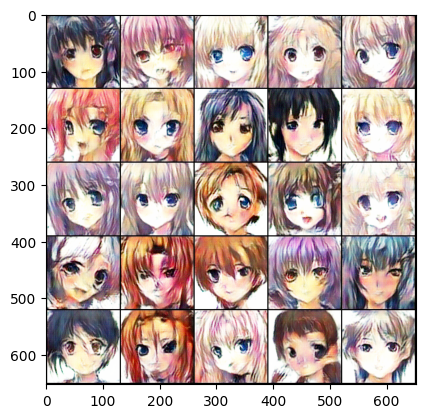

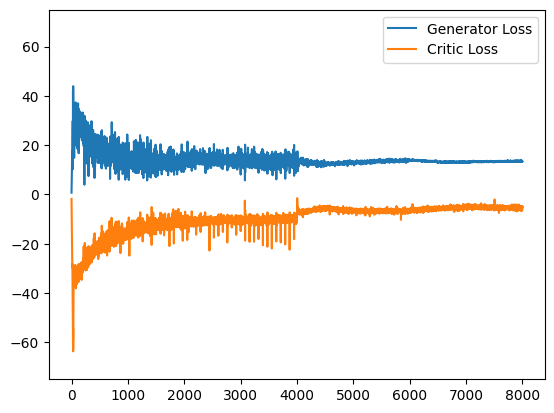

Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 102, Step 8100: Generator Loss: 13.590754508972168, Critic Loss: -4.812709331512451
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 103, Step 8200: Generator Loss: 13.424214363098145, Critic Loss: -4.763885498046875
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 105, Step 8300: Generator Loss: 13.489828109741211, Critic Loss: -5.099454879760742
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 106, Step 8400: Generator Loss: 13.329044342041016, Critic Loss: -4.850103855133057
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 107, Step 8500: Generator Loss: 13.507111549377441, Critic Loss: -5.257024765014648


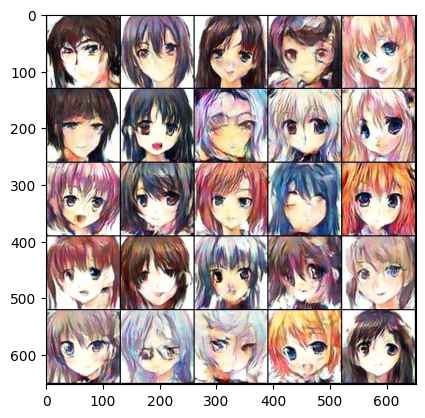

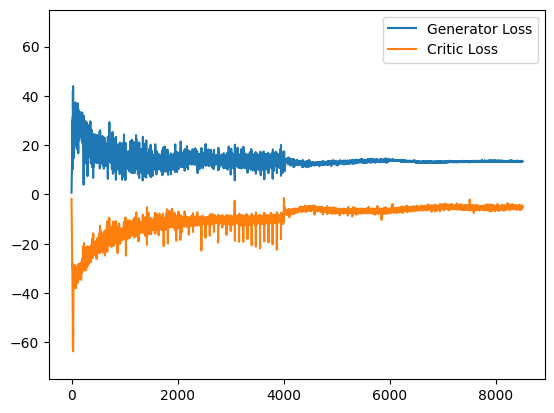

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 108, Step 8600: Generator Loss: 13.523286819458008, Critic Loss: -5.114721298217773
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 110, Step 8700: Generator Loss: 13.45954704284668, Critic Loss: -5.391623020172119
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 111, Step 8800: Generator Loss: 13.37059211730957, Critic Loss: -4.975820064544678
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 112, Step 8900: Generator Loss: 13.490029335021973, Critic Loss: -5.245075702667236
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 113, Step 9000: Generator Loss: 13.597625732421875, Critic Loss: -4.582573413848877


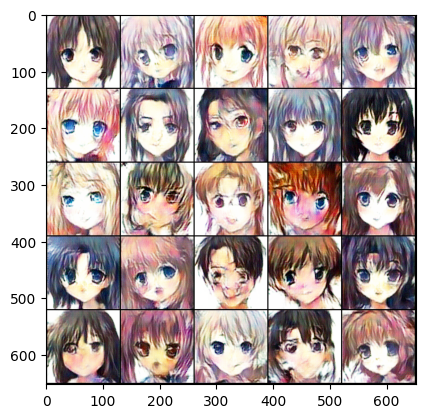

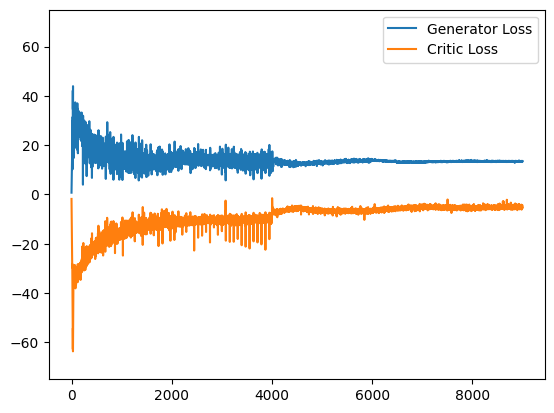

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 115, Step 9100: Generator Loss: 13.328129768371582, Critic Loss: -4.867180824279785
Checkpoint saved successfully.
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch 116, Step 9200: Generator Loss: 13.385068893432617, Critic Loss: -5.8198747634887695
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 117, Step 9300: Generator Loss: 13.438114166259766, Critic Loss: -5.1660380363464355
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.
Epoch 118, Step 9400: Generator Loss: 13.75413703918457, Critic Loss: -5.044318199157715
Checkpoint saved successfully.


  0%|          | 0/79 [00:00<?, ?it/s]

Checkpoint saved successfully.


KeyboardInterrupt: 

In [18]:
for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        real = real.to(device)

        # Critic training
        for _ in range(crit_cycles):
            crit_opt.zero_grad()
            fake_noise = gen_noise(len(real), z_dim, device=device)
            fake = gen(fake_noise)

            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            crit_loss = -(torch.mean(crit_real_pred) - torch.mean(crit_fake_pred))

            # Gradient penalty
            alpha = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gp = get_gp(real, fake.detach(), crit, alpha)
            crit_loss += gp

            crit_loss.backward()
            crit_opt.step()

        # Generator training
        gen_opt.zero_grad()
        fake_noise = gen_noise(len(real), z_dim, device=device)
        fake = gen(fake_noise)

        crit_fake_pred = crit(fake)
        gen_loss = -torch.mean(crit_fake_pred)

        gen_loss.backward()
        gen_opt.step()

        # Logging losses
        gen_losses.append(gen_loss.item())
        crit_losses.append(crit_loss.item())

        if cur_step % info_step == 0:
            print(f"Epoch {epoch}, Step {cur_step}: Generator Loss: {gen_loss.item()}, Critic Loss: {crit_loss.item()}")

        # Show generated samples every 'show_step' steps
        if cur_step % show_step == 0:
            show(fake, name=f"Generated image at step {cur_step} (Epoch {epoch})")

            plt.plot(
            range(len(gen_losses)),
            torch.Tensor(gen_losses),
            label="Generator Loss"
            )

            plt.plot(
                range(len(gen_losses)),
                torch.Tensor(crit_losses),
                label="Critic Loss"
            )

            plt.ylim(-75,75)
            plt.legend()
            plt.show()

        # Save model checkpoint every 'save_step' steps
        if cur_step % save_step == 0:
            save_checkpoint(f"step_{cur_step}_epoch_{epoch}")


        # After step 2000, adjust learning rates to provide a more stable training environment
        # The goal is to start with higher learning rates as both the generator and critic begin with high loss values,
        # then gradually lower the rates to stabilize training and improve convergence
        if 10000 >= cur_step and cur_step >= 2000:
            # Check and adjust critic's learning rate
            old_crit_lr = crit_opt.param_groups[0]['lr']
            crit_scheduler.step()
            new_crit_lr = crit_opt.param_groups[0]['lr']
            if new_crit_lr != old_crit_lr:
                print(f"------------ Critic LR has changed: {old_crit_lr} -> {new_crit_lr} (Epoch {epoch} - Step {cur_step}) ------------")

            # Check and adjust generator's learning rate
            old_gen_lr = gen_opt.param_groups[0]['lr']
            gen_scheduler.step()
            new_gen_lr = gen_opt.param_groups[0]['lr']
            if new_gen_lr != old_gen_lr:
                print(f"------------ Generator LR has changed: {old_gen_lr} -> {new_gen_lr} (Epoch {epoch} - Step {cur_step}) ------------")

        cur_step += 1
